# Paper Plots for the second revision of Busecke et al. 2022 

This Notebook contains the code to reproduce Figures 1/4/5/7 and the map in Figure 6, as well as the supplementary figures S1-4 and S6-10.

The appearance of the final Figures has been further touched up with Adobe illustrator, but these changes are restricted to labelling and arranging panels.

> TODO for revision:

- Replace all the paths to local directory.
- Test if all runs
- Test binder
- Refactor as the main notebook

In [1]:
# uncomment and run to download the data (needs to be done only once in either notebook and takes a while)
# !cd ../ && ./scripts/download_zenodo_files.sh

In [2]:
import pathlib
import os
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cmocean.cm as cmo
import cartopy.crs as ccrs
from xhistogram.xarray import histogram



from xarrayutils.utils import xr_linregress, sign_agreement
from xarrayutils.filtering import filter_2D
from xarrayutils.plotting import linear_piecewise_scale, letter_subplots

from cmip6_omz.units import convert_mol_m3_mymol_kg
from cmip6_omz.omz_tools import mask_basin

from busecke_etal_2021_aguadv.plotting import (
    o2_model_colors,
    model_color_legend,
    mask_multi_model,
    polish_map,
)
from busecke_etal_2021_aguadv.utils import (
    load_directory,
    fail_age,
    slope,
    trend_slice,
    regrid,
)

import warnings
warnings.filterwarnings("ignore")

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

## Global Parmeters

In [ ]:
zkwargs = {"use_cftime": True, "consolidated": True}

core_o2 = 20
middle_o2 = 60
outer_o2 = 120
o2_th = [core_o2, middle_o2, outer_o2]
contour_lines = o2_th

projection = ccrs.Robinson(210)
map_kwargs = dict(x='lon', y='lat', transform=ccrs.PlateCarree())
single_figsize_y = 4
single_figsize_x = 8

sign_threshold = 0.6

section_bounds = [200, 230]

map_section_unit_cmap_dict = {
    "o2":{'full_name':"Oxygen",'name':'Oxygen change', 'units':'$\mu$mol/kg/century', 'cmap':'RdBu_r'},
    "epc100":{'full_name':"Particulate Export" ,'name':'Particulate Organic Carbon Flux change', 'units':'mol/$m^2$/s/century', 'cmap':'RdBu'},
    'agessc':{'full_name':"Ideal Age" ,'name':'Ideal Age change', 'units':'yrs/century', 'cmap':'RdBu'},
    "aou":{'full_name':"AOU" ,'name':'Apparent Oxygen Utilization change', 'units':'$\mu$mol/kg/century', 'cmap':'RdBu'},
    "o2sat":{'full_name':"o2sat" ,'name':'Saturation Oxygen Concentration change', 'units':'$\mu$mol/kg/century', 'cmap':'RdBu_r'},
}

pfolder = pathlib.Path('../plots/')


# make sure the plot folder is empty
for f in pfolder.glob('*'):
    print(f)
#     os.remove(f)

# for development use local path
# dfolder = pathlib.Path('/projects/GEOCLIM/LRGROUP/jbusecke/projects/busecke_etal_2021_aguadv/data/processed_revision_2.2/')

#second level check with data collected via copying
# dfolder = pathlib.Path('/projects/GEOCLIM/LRGROUP/jbusecke/projects/busecke_etal_2021_aguadv/data/processed_collect_revision_2_copied/')


# third level check with collected folder that was cleanly reprocessed (for the final version)
# dfolder = pathlib.Path('/projects/GEOCLIM/LRGROUP/jbusecke/projects/busecke_etal_2021_aguadv/data/processed_collect_revision_2/')

dfolder = pathlib.Path('../data/data')

## Custom Functions

In [4]:
def make_mask(ds, threshold, var='historical_o2_min_value'):
    # convert o2 value units
    o2 = convert_mol_m3_mymol_kg(ds[var])
    if 'time' in o2.dims:
        o2 = o2.mean('time')
    mask = (o2<threshold) # shoulf focus only on the real core
    return mask

def smooth(ds):
    ds = filter_2D(ds, 2, ["y", 'x'])
    return ds

def _mask_fail_age(ds):
    if fail_age(ds):
        ds['agessc'] = xr.ones_like(ds.agessc) * np.nan
    return ds

## Load Data

In [5]:
# load map data
depth_pattern = '100-3000m'

ds_combo_o2 = xr.open_zarr(dfolder.joinpath(f"combined_o2_{depth_pattern}.zarr")).o2
ds_combo_epc100 = xr.open_zarr(dfolder.joinpath(f"combined_epc100_{depth_pattern}.zarr")).epc100
ds_combo_age = xr.open_zarr(dfolder.joinpath(f"combined_agessc_{depth_pattern}.zarr")).agessc
ds_combo_o2sat = xr.open_zarr(dfolder.joinpath(f"combined_o2sat_{depth_pattern}.zarr")).o2sat
ds_combo_aou = -xr.open_zarr(dfolder.joinpath(f"combined_aou_{depth_pattern}.zarr")).aou
# ds_combo_o2residual = ds_combo_o2sat+ds_combo_aou

# boundary
ds_boundary_combined = xr.open_zarr(dfolder.joinpath('boundary_combined.zarr'), use_cftime=True)

In [6]:
# sections
ds_full_3d_changes = xr.open_dataset(dfolder.joinpath('full_3d_changes_combined.nc'))
# ds_section = ds_full_3d_changes.sel(
#     y=slice(-50,50),
#     lev=slice(None, 4000)
# ).sel(
#     x=slice(section_bounds[0], section_bounds[1])
# ).mean('x')

## Figure 1: OMZ validation

OMZ boundary 20


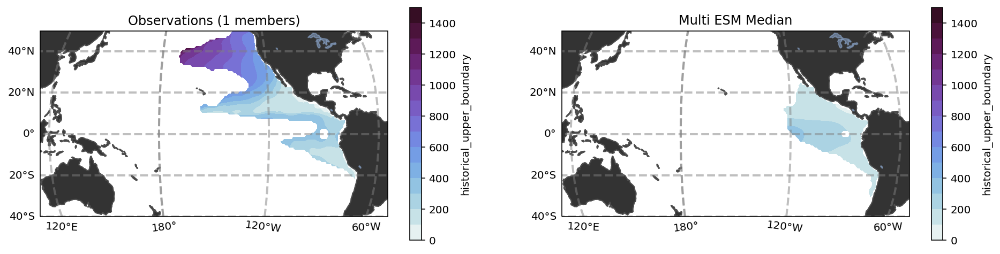

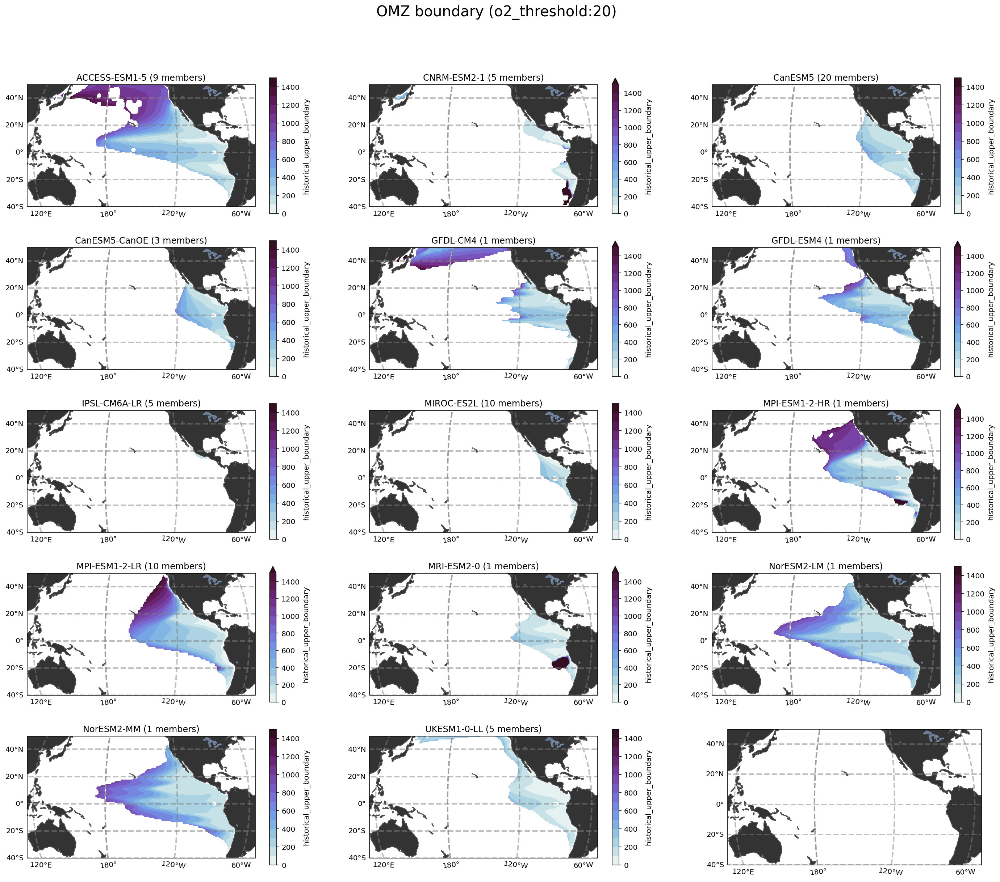

Minimum o2 20


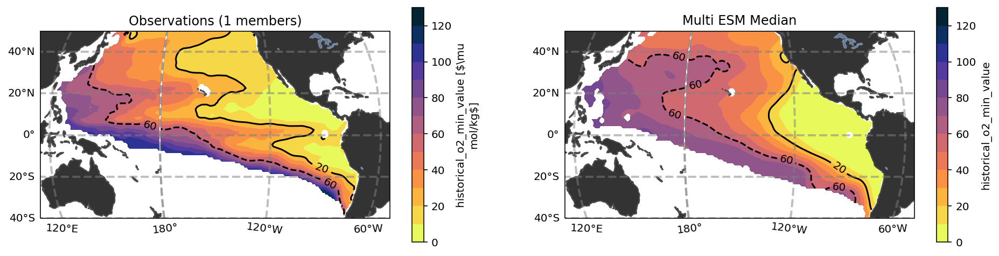

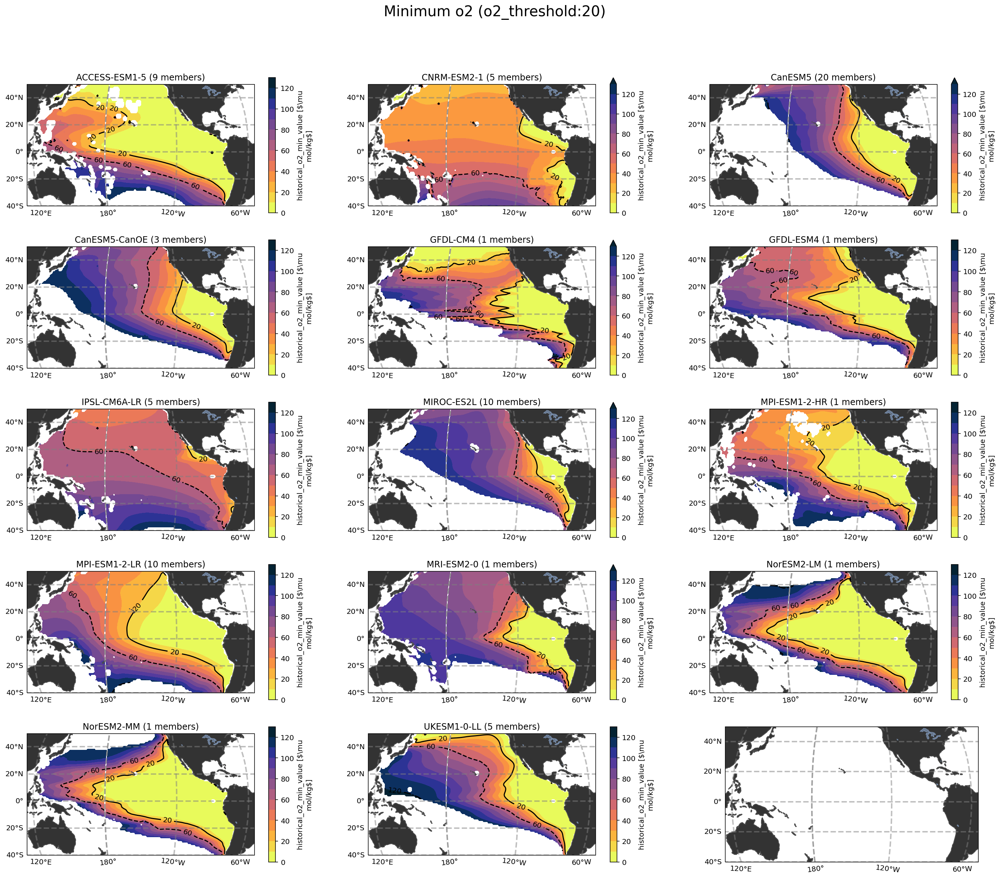

OMZ boundary 60


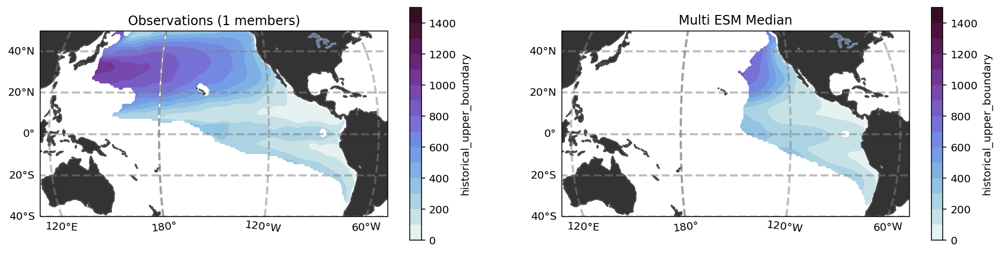

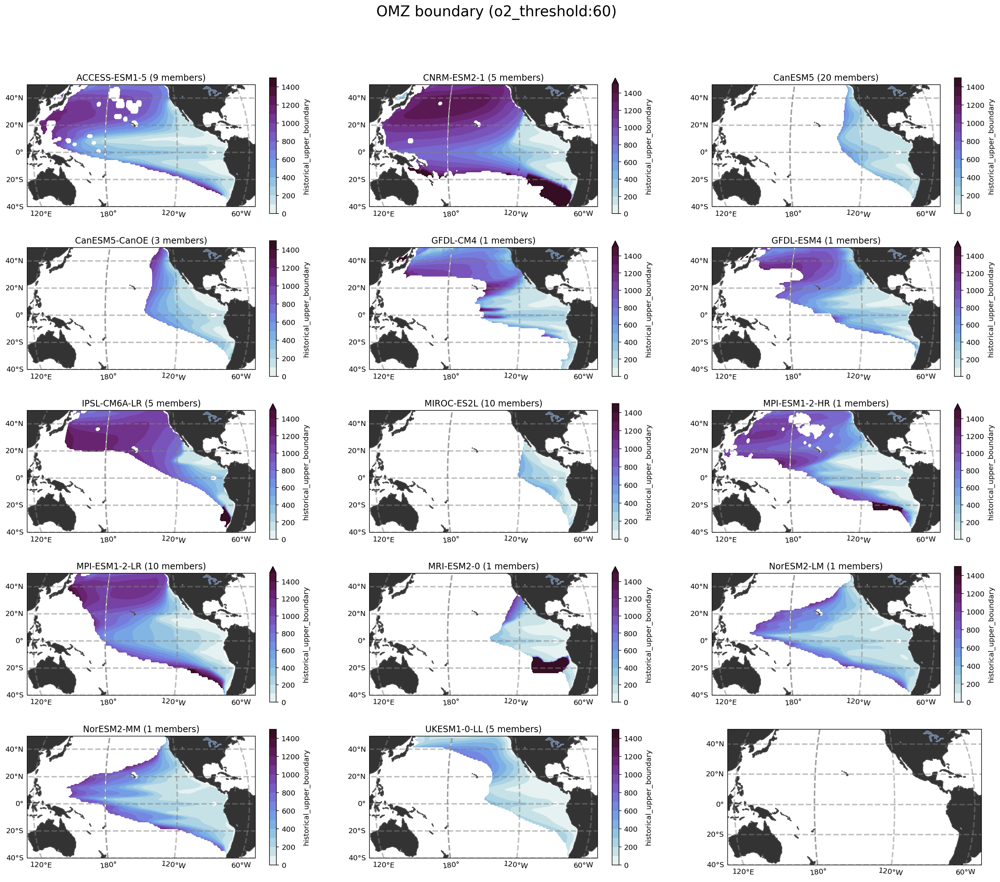

OMZ boundary 120


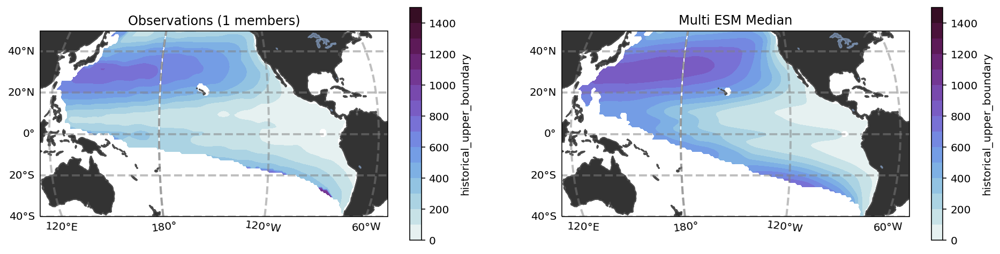

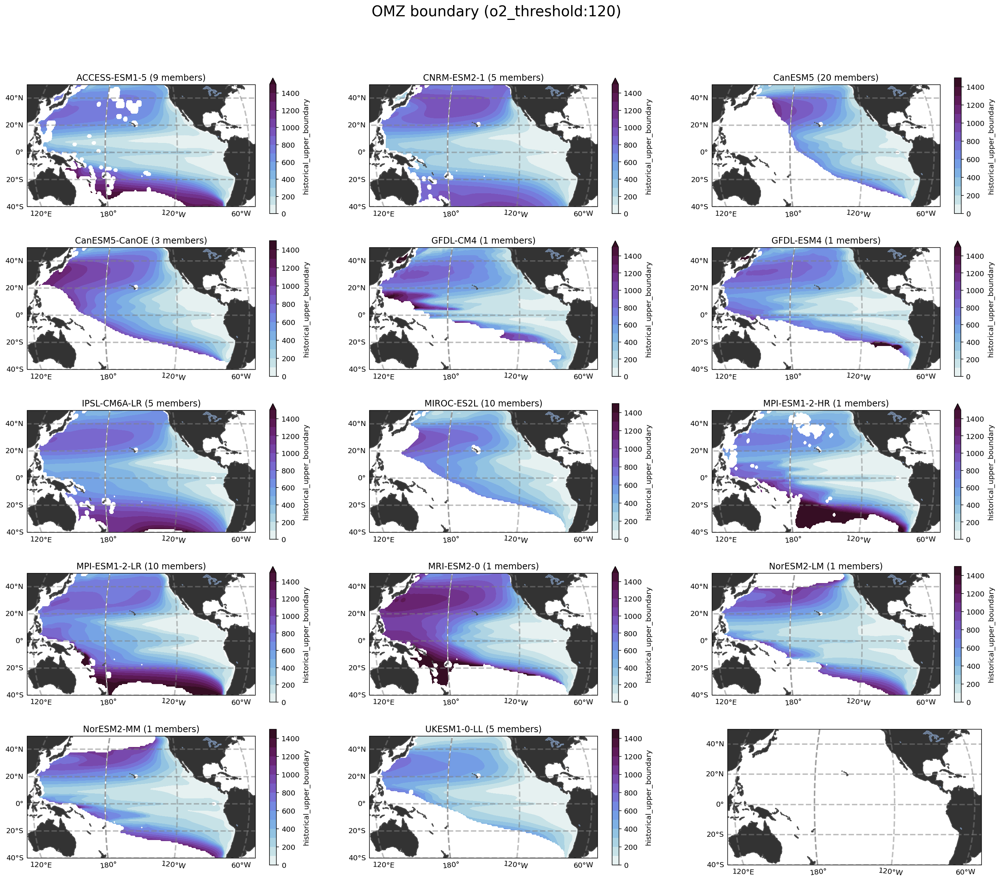

In [7]:
obs = regrid(ds_boundary_combined.sel(model='obs_bianchi').load())

for o2_threshold in [core_o2, middle_o2, outer_o2]:
    for title, vmin, vmax, cmap, levels in [
        ("OMZ boundary", 0, 1500, cmo.dense, 16),
        ("Minimum o2", 0, 130, cmo.thermal_r, 14),
    ]:
        if title == 'Minimum o2' and o2_threshold != core_o2:
            pass
        else:
            p_datasets = []
            p_contour_datasets = []

            print(f"{title} {o2_threshold}")
            fig_final, (ax_obs, ax_mmm) = plt.subplots(
                ncols=2,
                figsize=[single_figsize_x * 2, single_figsize_y],
                subplot_kw={"projection": projection},
            )

            fig, axarr = plt.subplots(
                ncols=3,
                nrows=5,
                figsize=[single_figsize_x * 3, single_figsize_y * 5],
                subplot_kw={"projection": projection},
            )

            ax_counter = 0

            for name in ds_boundary_combined.model.data:
                if 'obs' in name:
                    ax = ax_obs
                else:
                    ax = axarr.flat[ax_counter]
                    ax_counter += 1

                # specific to the plot

                ds = ds_boundary_combined.sel(model=name)
                averaged_members = ds.averaged_members.data
                # mask land
                ds = ds.where(ds.historical_o2_min_value < 1000)

                broad_o2_threshold = outer_o2+40
                # mask broadly for all plots
                ds = ds.where(make_mask(ds, broad_o2_threshold))
                # further mask for areas with near zero thickness (problem with the original algo)
                thickness = (ds.historical_lower_boundary - ds.historical_upper_boundary)
                another_mask = thickness.sel(o2_threshold=outer_o2)>1

                ds = ds.where(another_mask)

                map_kwargs = dict(x="lon", y="lat", transform=ccrs.PlateCarree())
                plot_kwargs = dict(
                        cmap=cmap,
                        vmin=vmin,
                        vmax=vmax,
                        levels=levels,
                        cbar_kwargs={'extend':'neither'},
                        rasterized=True,
                        **map_kwargs
                    )

                if title == 'Minimum o2':
                    p = convert_mol_m3_mymol_kg(ds['historical_o2_min_value'])

                elif title == "Minimum o2 Depth":
                    p = ds['historical_o2_min_lev']

                elif title == 'OMZ boundary':
                    ds = ds.where(make_mask(ds, o2_threshold))
                    p = ds['historical_upper_boundary'].sel(o2_threshold=o2_threshold)
                else:
                    raise RuntimeError('Nope')

                # regrid
                p = regrid(p.load()) 

                # raise values near zero by a small amount to avoid problems with the colorbar
                p = p.where(np.logical_or(p>1, np.isnan(p)), 1)

                p = mask_basin(p)
                if not 'obs' in name:
                    p_datasets.append(p)

                # main plot
                p.plot.contourf(ax=ax, **plot_kwargs)

                if title == 'Minimum o2':
                    # plot contour values
                    ch = p.plot.contour(
                        ax=ax,
                        add_cbar=False,
                        add_labels=False,
                        colors="k",
                        levels=contour_lines,
                        linestyles=["-", "--", "-."],
                        **map_kwargs
                    )
                    plt.clabel(ch)

                axtitle = "Observations" if "obs" in name else name
                ax.set_title(f"{axtitle} ({averaged_members.compute()} members)")

            # print multi model mean
            da_mmm = xr.concat(p_datasets, 'model')
            assert all(['obs' not in model for model in da_mmm.model.data])
            #filter grid points where only a few models have values
            da_mmm = da_mmm.where(mask_multi_model(da_mmm))
            da_mmm = da_mmm.median('model')
            
            # Smooth the data
            da_mmm = smooth(da_mmm)

            da_mmm.plot.contourf(ax=ax_mmm, **plot_kwargs)

            ax_mmm.set_title('Multi ESM Median')

            # plot obs_values
            if title == 'Minimum o2':
                ch = da_mmm.plot.contour(
                    ax=ax_mmm,
                    add_cbar=False,
                    add_labels=False,
                    colors="k",
                    levels=contour_lines,
                    linestyles=["-", "--", "-."],
                    **map_kwargs
                )
                plt.clabel(ch)

            # Mapping extras for all axes
            for ax in list(axarr.flat)+[ax_obs, ax_mmm]:
                polish_map(ax)


            title_print = f'{title} (o2_threshold:{o2_threshold})'
            fig.suptitle(title_print, y=0.95, fontsize=20)
            fig.savefig(pfolder.joinpath(f"{title_print}_SI.pdf"))
            fig.suptitle(title_print, y=0.95, fontsize=20)
            fig_final.savefig(pfolder.joinpath(f"{title_print}.pdf"))
            plt.show()

## Figure 4: Maps + Sections of changes

In [8]:
def median_map_plot(
    data,
    contour_data,
    ax,
    vmax=None,
    median_dim='model',
    cmap='RdBu_r',
    rasterized=False,
    units=None,
    name=None
):
    mmm = smooth(data.median(median_dim))
    mmm.name = name
    mmm.attrs['units'] =  units
    
    mmm.plot(
        ax=ax,
        vmax=vmax,
        cmap=cmap,
        rasterized=rasterized,
        **map_kwargs)

    # plot an indicator of the historical OMZ?
    ch = contour_data.plot.contour(
        ax=ax,
        levels=contour_lines,
        colors='k',
        linestyles = ['-', '--', '-.'],
        add_labels=False,
        add_colorbar=False,
        **map_kwargs
    )
    plt.clabel(ch)

    sign_agreement(data, mmm, 'model', threshold=sign_threshold).plot.contourf(
        ax=ax,
        levels=[0,0.5],
        hatches=['...',None],
        colors='none',
        add_labels=False,
        add_colorbar=False,
        **map_kwargs
    )
    polish_map(ax)

Dots shows where less than 9.0 models agree on the sign
Dots shows where less than 9.0 models agree on the sign
Dots shows where less than 9.0 models agree on the sign
Dots shows where less than 6.0 models agree on the sign


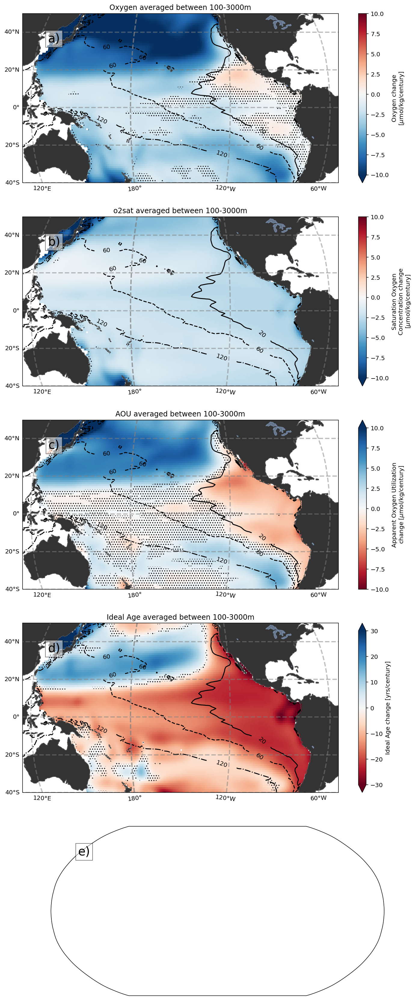

In [9]:
fig, axarr = plt.subplots(
    subplot_kw=dict(projection=projection),
    figsize=[single_figsize_x*1.5, single_figsize_y*1.5*5,],
    nrows=5,
    ncols=1
)

['o2', 'o2sat', 'aou', 'agessc']


for ax, (ds, title_var, vmax) in zip(
    axarr.flat, 
    [
        (ds_combo_o2, "o2", 10),
        (ds_combo_o2sat, "o2sat", 10),
        (-ds_combo_aou, "aou", 10),
        (ds_combo_age, "agessc", 30),
    ]
):        
    full_name =map_section_unit_cmap_dict[title_var]["full_name"]
    full_title = f'{full_name} averaged between {depth_pattern}'
    
    omz_ref = convert_mol_m3_mymol_kg(ds_boundary_combined.historical_o2_min_value).median('model')
    omz_ref = omz_ref.where(omz_ref<1e10)#.fillna(0)
    
    if title_var in ['o2', 'aou', 'o2sat']:
        ds = convert_mol_m3_mymol_kg(ds)
    
    median_map_plot(
        ds,
        omz_ref,
        ax,
        vmax=vmax,
        median_dim='model',
        cmap=map_section_unit_cmap_dict[title_var]['cmap'],
        rasterized=False,
        name=map_section_unit_cmap_dict[title_var]['name'],
        units=map_section_unit_cmap_dict[title_var]['units'],
    )
    
    n_models = len(ds.model)
    dotted = np.ceil(n_models*sign_threshold)
    print(f'Dots shows where less than {dotted} models agree on the sign')
    
    ax.set_title(f"{full_title}")
#     for section_bound in section_bounds:
#         ax.plot(
#             [section_bound, section_bound],
#             [-50, 50],
#             transform=ccrs.PlateCarree(),
#             color='0.3',
#             lw=1,
#             ls='--'
#         )
letter_subplots(axarr, start_idx=0, fontsize=20, box_color='w')
fig.savefig(pfolder.joinpath(f"Maps.pdf"))

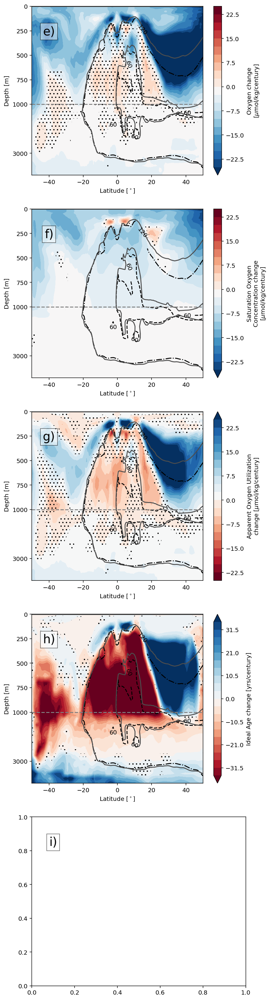

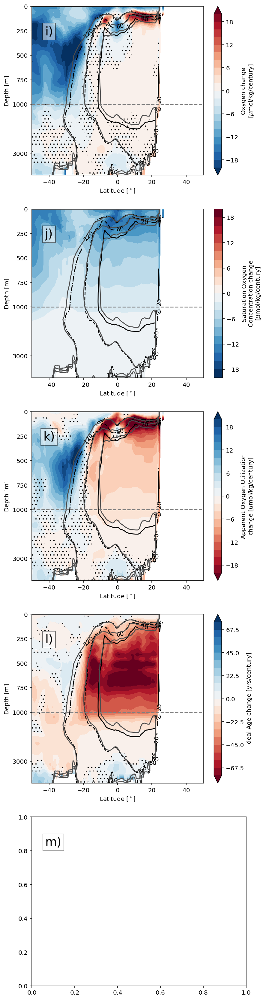

In [10]:
for (x0, x1, oxy_vmax, age_vmax, start_idx) in [(200, 220, 25, 35, 4), (250, 270, 20, 75, 8)]:
    
    fig, axarr = plt.subplots(
        figsize=[single_figsize_x*0.8, single_figsize_y*1.5*5,],
        nrows=5,
        ncols=1
    )
    ds_section = ds_full_3d_changes.sel(
        y=slice(-50,50),
        lev=slice(None, 4000)
    ).sel(
        x=slice(x0, x1)
    ).mean('x')
    for ax, (da, title_var, vmax) in zip(
        axarr.flat, 
        [
            (ds_section.o2, "o2", oxy_vmax),
            (ds_section.o2sat, "o2sat", oxy_vmax),
            (ds_section.aou, "aou", oxy_vmax),
            (ds_section.agessc, "agessc", age_vmax),
        ]
    ):
        plot_kwargs = dict(ax=ax, yincrease=False)

        da = da.isel(time=1).squeeze()
        cmap = map_section_unit_cmap_dict[title_var]['cmap']

        aggregated = da.median('source_id')
        aggregated.name = map_section_unit_cmap_dict[title_var]['name']
        aggregated.attrs['units'] = map_section_unit_cmap_dict[title_var]['units']


        sign = sign_agreement(da, aggregated, 'source_id',threshold=sign_threshold, count_nans=False)
        aggregated.plot.contourf(levels=21,vmax=vmax, center=0, cmap=cmap, **plot_kwargs)
        sign.plot.contourf(
            colors='none',
            hatches=['..', None],
            levels=[0,0.5],
            add_colorbar=False,
            **plot_kwargs
        )
        ch = ds_section.o2.isel(time=0).median('source_id').plot.contour(
            levels=contour_lines,
            linestyles = ['-', '--', '-.'],
            colors='k',
            **plot_kwargs
        )
        plt.clabel(ch)
        ds_section.o2.sum('time').median('source_id').plot.contour(
            levels=contour_lines,
            colors='0.3',
            **plot_kwargs
        )

        linear_piecewise_scale(1000, 3, ax=ax)
        #indicate the point between the different scalings
        ax.axhline(1000, color='0.5', ls='--')
        # Rearange the yticks
        ax.set_yticks([0, 250, 500, 750, 1000, 3000]);
        ax.set_title('')
        ax.set_ylabel('Depth [m]')
        ax.set_xlabel('Latitude [$^\circ$]')
    letter_subplots(axarr, start_idx=start_idx, fontsize=20, box_color='w')
    fig.savefig(pfolder.joinpath(f"Sections-{x0}-{x1}.pdf"))

## Figure 5: Changes in OMZ volume and STC Index

In [11]:
## TODO: temp until sam is done with his stuff
from cmip6_preprocessing.postprocessing import concat_experiments
from busecke_etal_2021_aguadv.utils import stci

In [12]:
# Load the STC data
path = '/projects/GEOCLIM/LRGROUP/jbusecke/projects/busecke_etal_2021_aguadv/data/processed/pacific_meridional_overturning_filtered/'
flist = list(pathlib.Path(path).glob('*.nc'))
ddict_psi = {}
for f in flist:
    source_id, experiment_id = tuple(f.stem.replace('temp_','').replace('.nc','').split('_'))
    ds = xr.open_dataset(f, use_cftime=True)
    ds.attrs['source_id'] = source_id
    ds.attrs['experiment_id'] = experiment_id
    ddict_psi[f"{source_id}.{experiment_id}"] = ds
ddict_psi = concat_experiments(ddict_psi, concat_kwargs={'combine_attrs': 'drop_conflicts', 'compat': 'override', 'coords': 'minimal', 'join':'inner'},)
assert len(ddict_psi)==14

In [13]:
path = '/tigress/GEOCLIM/LRGROUP/samjd/global_omz/cmip6_omz/data/external/OMZ_time_series4/'

ddict_vol = load_directory(path, pattern='*.nc', naming='filename')
ddict_vol = {k.replace('_omz_vol',''):v for k,v in ddict_vol.items()}
ddict_vol.keys()

dict_keys(['MPI-ESM1-2-LR', 'IPSL-CM6A-LR', 'CanESM5-CanOE', 'UKESM1-0-LL', 'CNRM-ESM2-1', 'NorESM2-LM', 'MRI-ESM2-0', 'CanESM5', 'GFDL-ESM4', 'MIROC-ES2L', 'MPI-ESM1-2-HR', 'ACCESS-ESM1-5', 'NorESM2-MM', 'GFDL-CM4'])

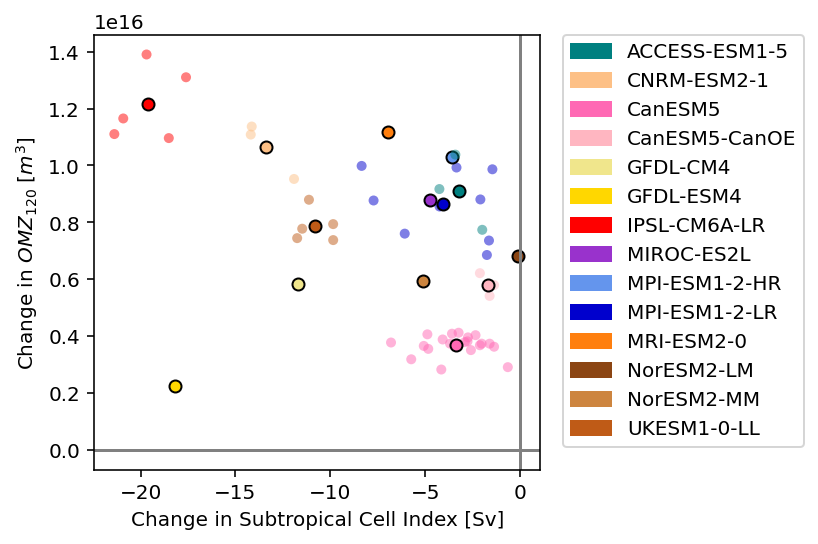

In [14]:
o2=120
fig, ax_scatter = plt.subplots(ncols=1, figsize=[4,4])
for name in ddict_vol.keys():
    co = o2_model_colors()[name]

    ds_vol = ddict_vol[name]
    ds_psi = ddict_psi[name]

    stc = stci(ds_psi)
    stc = stc.where((stc>0).all('time'))
    stc = stc/1e6 # convert to sverdrup
    vol = ds_vol.volume
    
    # select only the low oxygenated waters (the bins are centered, thus the offset)
    vol = vol.sel(o2_bin=115)


    # select only relevant time
    stc = stc.sel(time=slice('1850', '2100')).load()
    vol = vol.sel(time=slice('1850', '2100')).load()

    # align the members
    stc, vol = xr.align(stc, vol, join='inner', exclude='time')
    
    x = stc
    y = vol
    
    x,_ = slope(x.sel(time=trend_slice))
    y,_ = slope(y.sel(time=trend_slice))

    ax_scatter.scatter(x.data, y.data, color=co, edgecolor='none', alpha=0.5, s=25)
    ax_scatter.scatter(x.mean('member_id').data, y.mean('member_id').data, color=co, edgecolor='k')
    ax_scatter.set_ylabel('Change in $OMZ_{120}$ [$m^3$]')
    ax_scatter.set_xlabel('Change in Subtropical Cell Index [Sv]')

    ax_scatter.axhline(0, color='0.5')
    ax_scatter.axvline(0, color='0.5')
    
model_color_legend()
    
fig.savefig(pfolder.joinpath('STC.pdf'))

## Figure 6: Biological changes

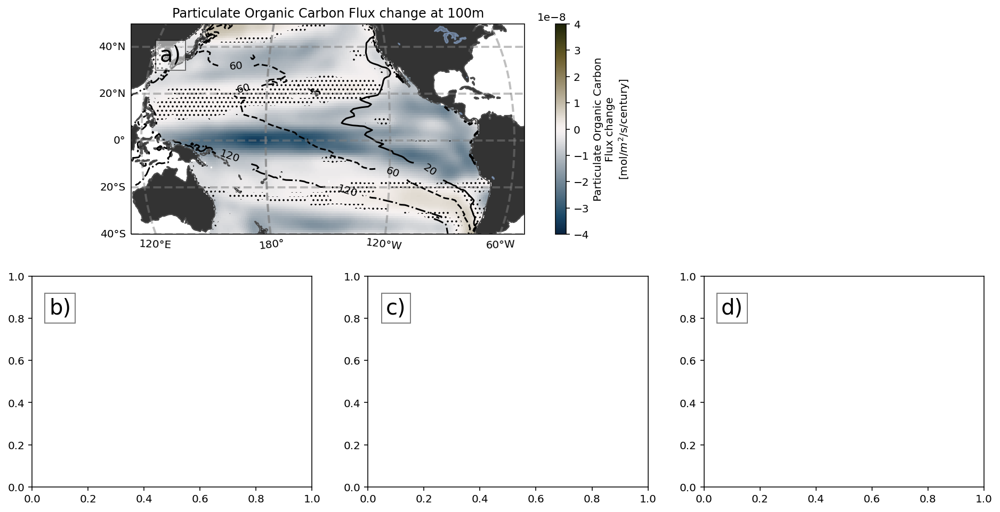

In [15]:
fig = plt.figure(figsize = [single_figsize_x*2, single_figsize_y*2])
nrows = 3
gs = fig.add_gridspec(2, 3)

ax_map = fig.add_subplot(gs[0,:-1], projection=projection)
axarr = [fig.add_subplot(gs[1,i]) for i in range(nrows)]

# print epc median map
ds = ds_combo_epc100
omz_ref = convert_mol_m3_mymol_kg(ds_boundary_combined.historical_o2_min_value).median('model')
omz_ref = omz_ref.where(omz_ref<1e10)
name = map_section_unit_cmap_dict['epc100']['name']
full_title = f'{name} at 100m'
vmax = 4e-8
median_map_plot(
        ds,
        omz_ref,
        ax_map,
        vmax=vmax,
        cmap=cmo.diff,
        rasterized=False,
        name=name,
        units=map_section_unit_cmap_dict['epc100']['units'],
    )


ax_map.set_title(f"{full_title}")


letter_subplots(np.array([ax_map]+axarr), start_idx=0, fontsize=20, box_color='w')
fig.savefig(pfolder.joinpath('bio_argument.pdf'))

## Figure 7: Relationship to OMZ boundary

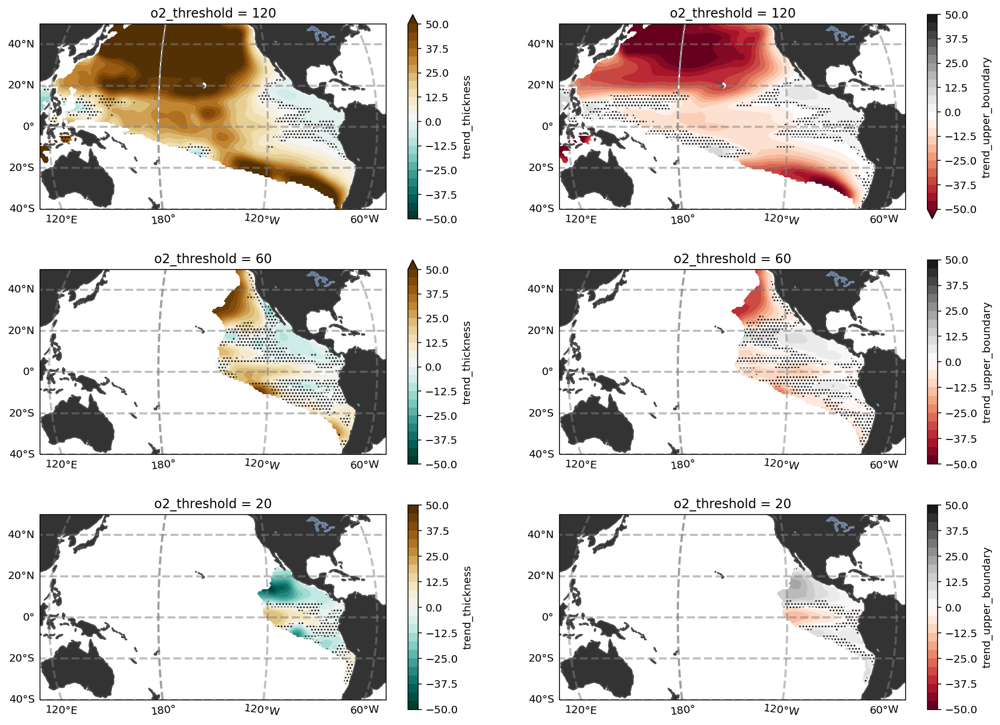

In [16]:
from xarrayutils.utils import sign_agreement
ds = ds_boundary_combined.drop_sel(model='obs_bianchi')

fig, axarr_full = plt.subplots(
    nrows=len(o2_th),
    ncols=2,
    subplot_kw={'projection':projection},
    figsize=[single_figsize_x*2, single_figsize_y*len(o2_th)],
)

for ai, (var, vmax, levels, cmap) in enumerate(
    [
        ('trend_thickness', 50, 25, 'BrBG_r'),
        ('trend_upper_boundary', 50, 25, 'RdGy')
    ]):
    da = ds[var]
    axarr = axarr_full[:,ai]
    
    # mask out the areas that do not have many models with an OMZ there.
    nan_mask = mask_multi_model(da)
    
    m = da.median('model').where(nan_mask).load()
    m = smooth(m)
    s = sign_agreement(da, m, 'model', count_nans=False, threshold=sign_threshold).where(nan_mask)
    # values shown where at least 10 models have an OMZ
    # areas that are not dotted have at least 7 models with that sign

    for o2, ax in zip(np.flip(o2_th), axarr):
        m.sel(o2_threshold=o2).plot.contourf(ax=ax, vmax=vmax, cmap=cmap, levels=levels,rasterized=True, **map_kwargs)
        s.sel(o2_threshold=o2).plot.contourf(
            ax=ax,
            levels=[0,0.5],
            hatches=['....', None],
            colors='none',
            add_labels=False, 
            add_colorbar=False,
            **map_kwargs)
        polish_map(ax)
fig.savefig(pfolder.joinpath(f"Thickness_Boundary.pdf"))

----------
upper-20
<xarray.Dataset>
Dimensions:    ()
Data variables:
    slope      float64 -0.5597
    intercept  float64 -2.488
    r_value    float64 -0.6587
    p_value    float64 0.0
    std_err    float64 0.003132
----------
upper-60
<xarray.Dataset>
Dimensions:    ()
Data variables:
    slope      float64 -0.61
    intercept  float64 1.459
    r_value    float64 -0.679
    p_value    float64 0.0
    std_err    float64 0.002154
----------
upper-120
<xarray.Dataset>
Dimensions:    ()
Data variables:
    slope      float64 -0.595
    intercept  float64 0.9761
    r_value    float64 -0.5603
    p_value    float64 0.0
    std_err    float64 0.002056


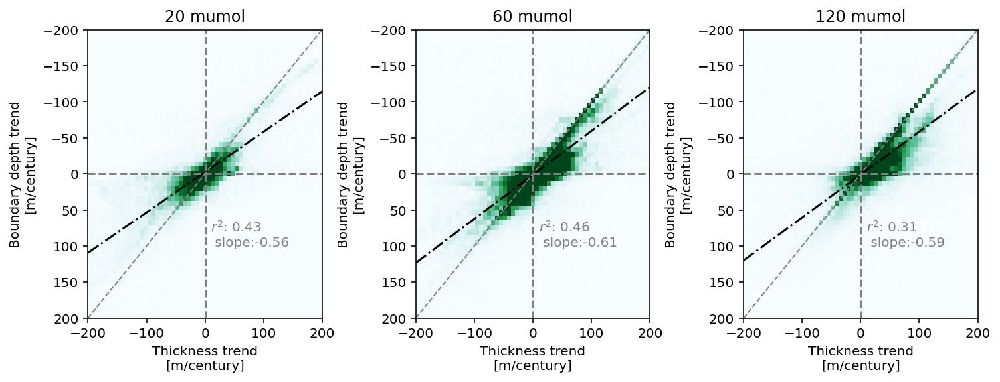

In [17]:
co = 'k'
slope_dict = {}

ds_scatter = ds_boundary_combined.drop_sel(model=['obs_bianchi'])

fig, axarr = plt.subplots(nrows=1, ncols=3, figsize=[12, 4])
for th, ax in [(core_o2, axarr[0]), (middle_o2, axarr[1]), (outer_o2, axarr[2])]:
    boundary = 'upper'

    if boundary == 'lower':
        y_var = 'trend_lower_boundary'
        diagonal_sign = 1
    else:
        y_var = 'trend_upper_boundary'
        diagonal_sign = -1
    outer_bin = 200
    x_bins = np.linspace(-outer_bin, outer_bin, 60)
    y_bins = np.linspace(-outer_bin, outer_bin, 60)
    x = ds_scatter.sel(o2_threshold=th).trend_thickness
    y = ds_scatter.sel(o2_threshold=th)[y_var]

    hist = histogram(x, y, bins=[x_bins, y_bins])
    hist.plot(
        ax=ax,
        vmin=0,
        vmax=500 if th == outer_o2 else 200,
        add_colorbar=False,
        x='trend_thickness_bin',
        cmap='BuGn',
        rasterized=True,
    )

    # flattern the arrays
    x_flat = x.load().data.reshape(-1, 1)
    y_flat = y.load().data.reshape(-1, 1)

    # remove the nans
    nan_mask = np.isnan(x_flat).reshape(-1, 1)
    x_flat = x_flat[~nan_mask]
    y_flat = y_flat[~nan_mask]

    # remove values that show very large thickness increase to prevent outliers
    large_value_mask = abs(x_flat) < outer_bin
    x_flat = x_flat[large_value_mask]
    y_flat = y_flat[large_value_mask]

    reg = xr_linregress(
        xr.DataArray(x_flat, dims=['dummy']),
        xr.DataArray(y_flat, dims=['dummy']),
        'dummy'
    ).load()

    line = x_bins * reg.slope.data + reg.intercept.data
    print('----------')
    print(f'{boundary}-{th}')
    print(reg)
    ax.text(10, 100, f"$r^2$: {reg.r_value.data**2:.2f} \n slope:{reg.slope.data:.2f}", color='0.5')
    ax.plot(x_bins, line, color='k', ls='-.')


    outer_bin_plot = outer_bin
    ax.set_xlim(-outer_bin_plot, outer_bin_plot)
    ax.set_ylim(outer_bin_plot, -outer_bin_plot)
    ax.axhline(0, color='0.5', ls='--')
    ax.axvline(0, color='0.5', ls='--')
    # plot expected line
    ax.plot(x_bins, diagonal_sign * x_bins, ls='--', lw=1, color='0.5')
    ax.set_xlabel('Thickness trend\n[m/century]')
    ax.set_ylabel(f'Boundary depth trend\n[m/century]')
    ax.set_title(f'{th} mumol')
fig.subplots_adjust(hspace=0.4, wspace=0.4)
fig.savefig(pfolder.joinpath(f"Thickness_Boundary_Scatter.pdf"))

# Extras

In [ ]:
# just a blank legend
plt.figure()
model_color_legend(bbox_to_anchor=[0.5, 1])
plt.savefig(pfolder.joinpath('legend.pdf'))

# SI

## SI: thickness/boundary

In [ ]:
ds = ds_boundary_combined.drop_sel(model='obs_bianchi')


for oi, o2 in enumerate(o2_th):
    fig, axarr = plt.subplots(
        ncols=4,
        nrows=len(ds.model.data)//2,
        subplot_kw={'projection':projection},
        figsize=[single_figsize_x*4,single_figsize_y*len(ds.model.data)//2],
    )

    for vi, (var, vmax, levels, cmap, axarr_sub) in enumerate(
        [
        ('trend_thickness', 50, 25, 'BrBG_r', list(axarr[:,0].flat)+list(axarr[:,2].flat)),
        ('trend_upper_boundary', 50, 25, 'RdGy',list(axarr[:,1].flat)+list(axarr[:,3].flat))
        ]):
        da = ds[var]
        for mi, (ax, model) in enumerate(zip(axarr_sub, da.model.data)):
            m = da.sel(model=model)
#             m = smooth(m)
            m.sel(o2_threshold=o2).plot(
                ax=ax,
                vmax=vmax,
                cmap=cmap,
                levels=levels,
                rasterized=True,
                **map_kwargs
            )
            polish_map(ax)
            ax.set_title(f"{model} members:{m.averaged_members.load().data}")
    plt.show()
    filename = f"thickness_upper_{o2}_SI.pdf"
    print(filename)
    fig.savefig(pfolder.joinpath(filename))

## SI: Sections

In [ ]:
for (x0, x1) in [(200, 220), (250, 270)]:
    ds_section = ds_full_3d_changes.sel(
        y=slice(-50,50),
        lev=slice(None, 4000)
    ).sel(
        x=slice(x0, x1)
    ).mean('x')

    fig, axarr = plt.subplots(ncols=4, nrows=14, sharex=True, sharey=True, figsize=[single_figsize_x*4,single_figsize_y*14])
    for source_id, sub_axarr in zip(ds_section.source_id.data, [axarr[i,:] for i in range(14)]):
        for var, ax in zip(['o2', 'o2sat', 'aou', 'agessc'], sub_axarr.flat):
            plot_kwargs = dict(ax=ax, yincrease=False)
            ds = ds_section.sel(source_id=source_id).isel(time=1).squeeze()

            da = ds[var].squeeze()
            da.name = map_section_unit_cmap_dict[var]['name']
            da.attrs['units'] = map_section_unit_cmap_dict[var]['units']

            da.plot.contourf(
                levels=21,
                robust=True,
                center=0,
                rasterized=True,
                cmap=map_section_unit_cmap_dict[var]['cmap'],
                **plot_kwargs)
            ch = ds_section.sel(source_id=source_id).isel(time=0).o2.plot.contour(
                levels=contour_lines,
                colors='k',
                **plot_kwargs
            )
            plt.clabel(ch)

            linear_piecewise_scale(1000, 3, ax=ax)
            # Rearange the yticks
            ax.set_yticks([0, 250, 500, 750, 1000, 3000]);
            ax.set_title('')
            ax.set_ylabel('Depth [m]')
            ax.set_xlabel('Latitude [$^\circ$]')
            ax.set_title(f'{source_id}')
    fig.savefig(pfolder.joinpath(f'section_SI-{x0}-{x1}.pdf'))